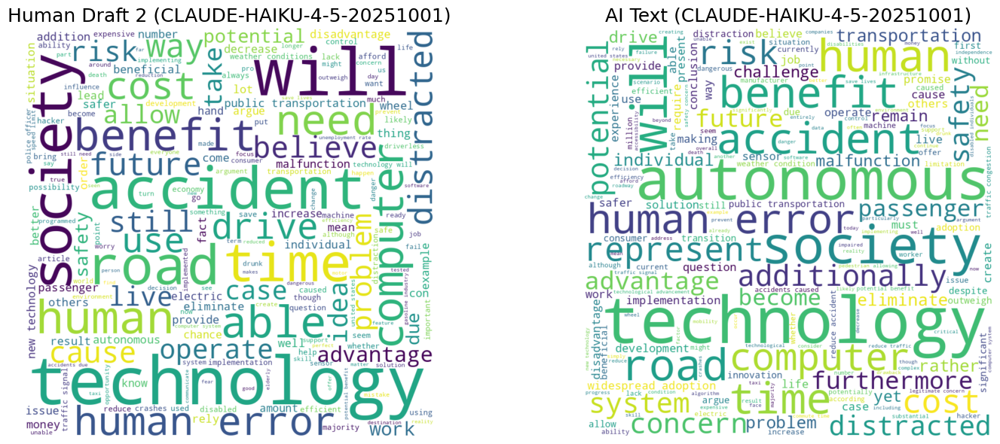

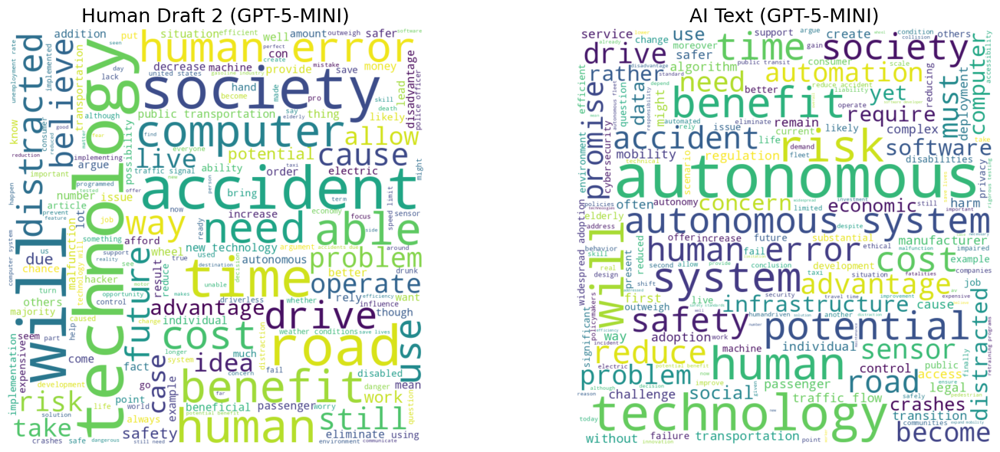

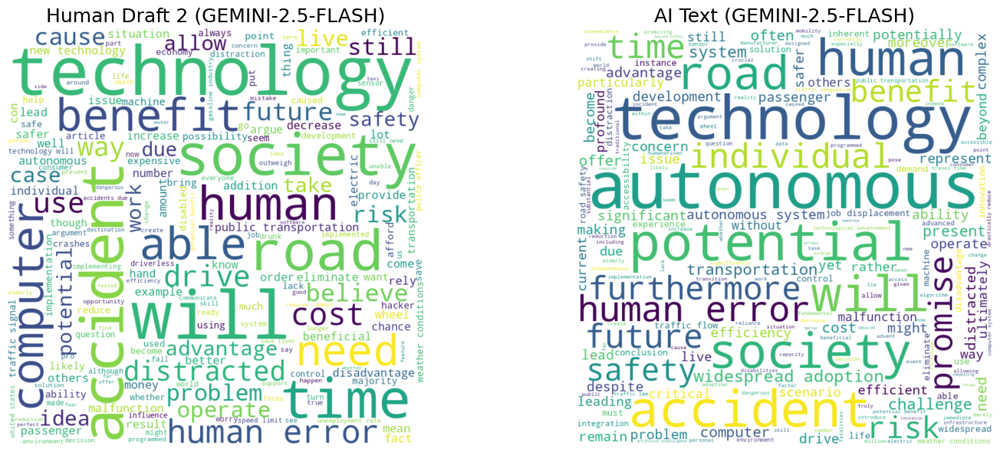

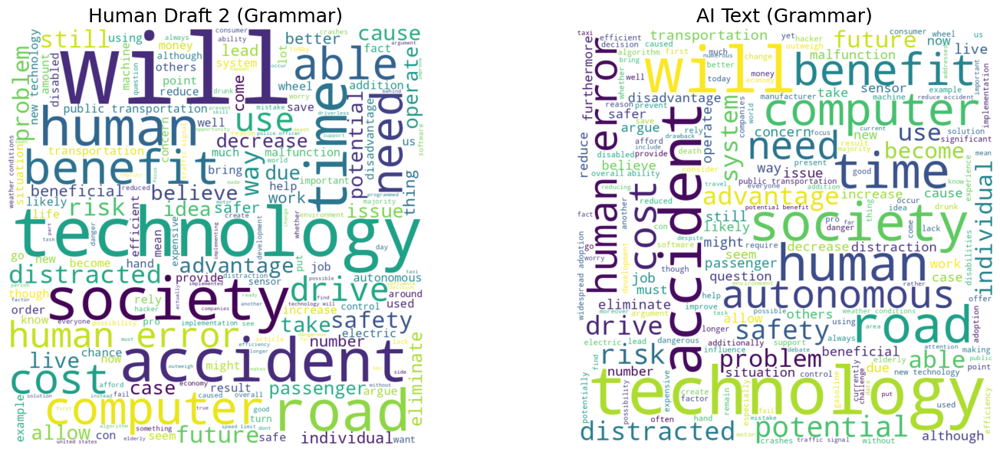

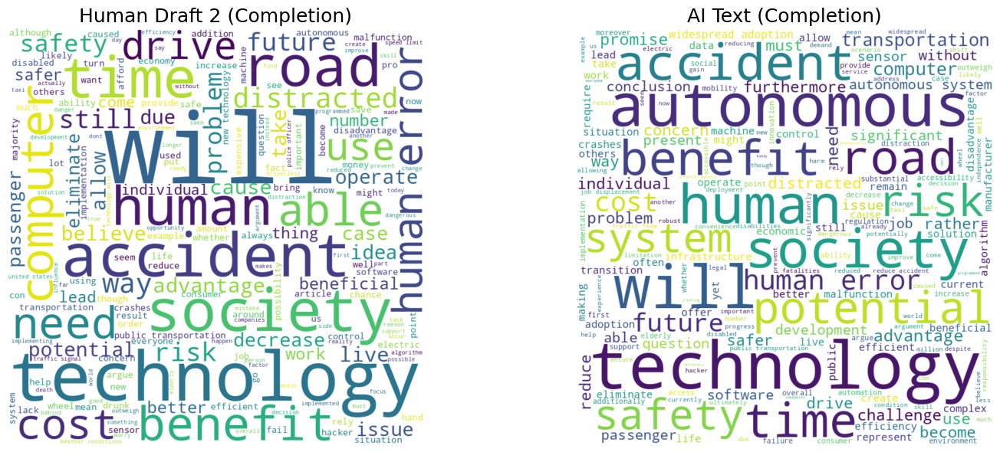

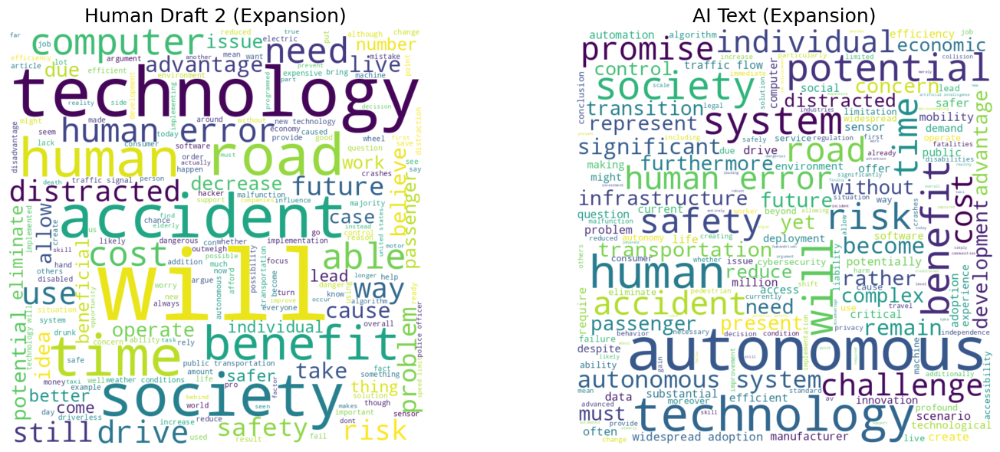

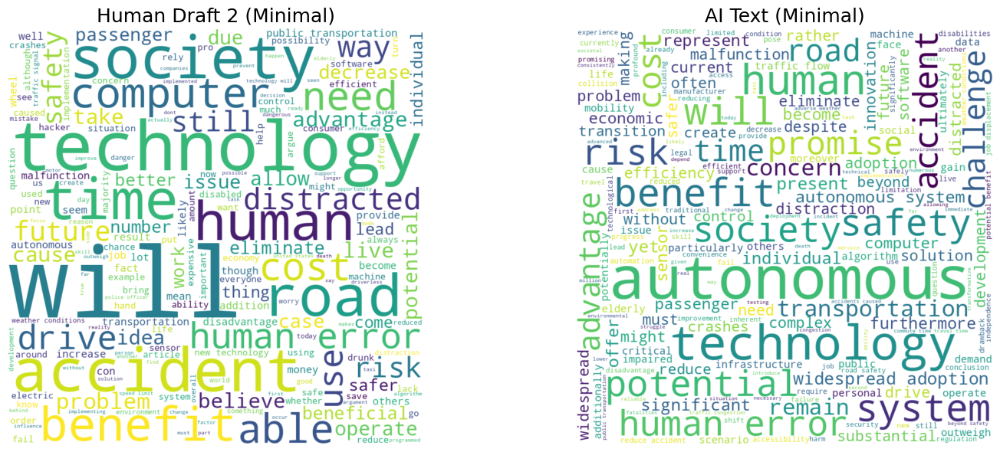

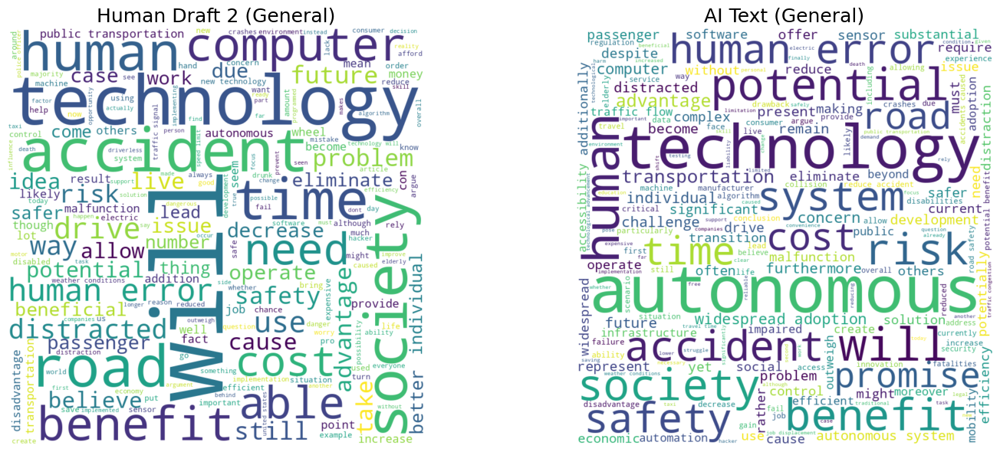

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import re

# Load the data
df = pd.read_csv('dataframe_essays_llm_model.csv')

# Define custom stopwords to filter out topic words and fillers
# This helps reveal stylistic differences
topic_stopwords = set([
    'car', 'cars', 'driving', 'vehicle', 'vehicles', 'selfdriving', 
    'self', 'driver', 'drivers', 'people', 'would', 'one', 'make', 
    'also', 'many', 'think', 'even', 'could', 'may'
])
all_stopwords = STOPWORDS.union(topic_stopwords)

def clean_text(text):
    if not isinstance(text, str): return ""
    return re.sub(r'[^a-z\s]', '', text.lower())

def generate_comparison(subset, label):
    """Generates a side-by-side WordCloud for Human vs AI text."""
    text_human = " ".join(subset['draft2'].dropna().apply(clean_text))
    text_ai = " ".join(subset['ai_text'].dropna().apply(clean_text))
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    wc_h = WordCloud(width=800, height=800, background_color='white', stopwords=all_stopwords).generate(text_human)
    wc_a = WordCloud(width=800, height=800, background_color='white', stopwords=all_stopwords).generate(text_ai)
    
    axes[0].imshow(wc_h, interpolation='bilinear')
    axes[0].set_title(f'Human Draft 2 ({label})', fontsize=18)
    axes[0].axis("off")
    
    axes[1].imshow(wc_a, interpolation='bilinear')
    axes[1].set_title(f'AI Text ({label})', fontsize=18)
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

# Generate for each Model
for model in df['llm_model'].unique():
    subset = df[df['llm_model'] == model]
    generate_comparison(subset, model)

# Generate for each Mode
for mode in df['mode'].unique():
    subset = df[df['mode'] == mode]
    generate_comparison(subset, mode.capitalize())

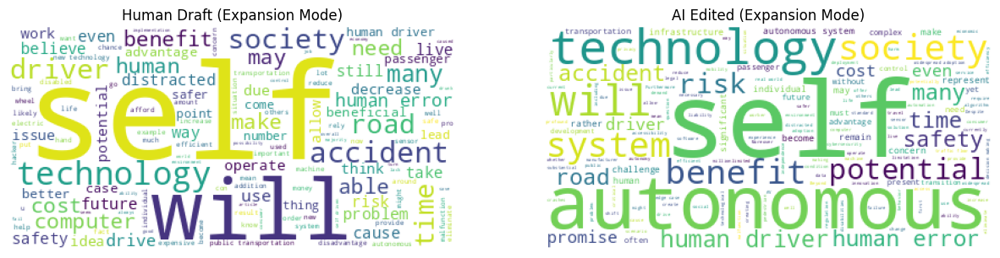

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

df = pd.read_csv('dataframe_essays_llm_model.csv')
custom_stops = STOPWORDS.union({'car', 'cars', 'driving', 'vehicle', 'vehicles', 'people', 'would', 'one'})

def plot_side_by_side(subset, title_label):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Human Cloud
    h_text = " ".join(subset['draft2'].dropna().astype(str))
    wc_h = WordCloud(background_color='white', stopwords=custom_stops).generate(h_text)
    axes[0].imshow(wc_h)
    axes[0].set_title(f"Human Draft ({title_label})")
    axes[0].axis('off')
    
    # AI Cloud
    a_text = " ".join(subset['ai_text'].dropna().astype(str))
    wc_a = WordCloud(background_color='white', stopwords=custom_stops).generate(a_text)
    axes[1].imshow(wc_a)
    axes[1].set_title(f"AI Edited ({title_label})")
    axes[1].axis('off')
    
    plt.show()

# Example: Generate for 'expansion' mode
plot_side_by_side(df[df['mode'] == 'expansion'], "Expansion Mode")

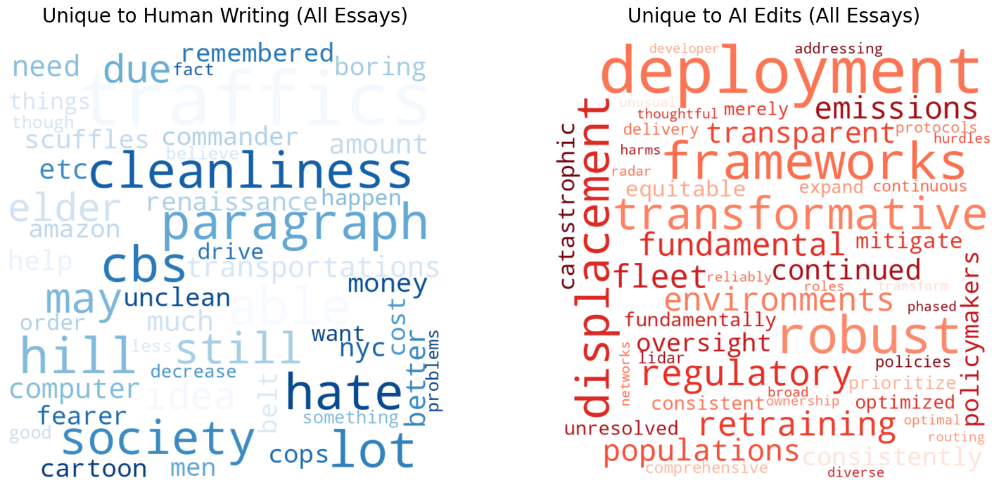

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
import re

# 1. Load the dataset
df = pd.read_csv('dataframe_essays_llm_model.csv')

# 2. Define "Topic Stopwords" to remove the shared context
# This allows the stylistic differences to surface
topic_stops = {
    'car', 'cars', 'driving', 'vehicle', 'vehicles', 'driver', 'drivers', 
    'road', 'roads', 'traffic', 'technology', 'system', 'systems', 'people',
    'autonomous', 'self', 'human', 'error', 'accidents', 'accident',
    'safety', 'safe', 'will', 'would', 'could', 'can', 'one', 'also', 'many',
    'even', 'think', 'make', 'way', 'new', 'well', 'time', 'take',
    'know', 'see', 'use', 'used', 'using'
}
all_stops = STOPWORDS.union(topic_stops)

def get_distinctive_frequencies(text_target, text_reference):
    """
    Calculates a frequency dictionary for text_target, weighting words 
    higher if they appear much more often here than in text_reference.
    """
    def tokenize(text):
        words = re.findall(r'\b\w{3,}\b', text.lower())
        return [w for w in words if w not in all_stops]
    
    counts_target = Counter(tokenize(text_target))
    counts_ref = Counter(tokenize(text_reference))
    
    # Calculate uniqueness scores
    # Score = Frequency in Target * (Ratio of usage vs Reference)
    weighted_freqs = {}
    for word, count in counts_target.items():
        # How much more frequent is it here than in the other text?
        uniqueness_ratio = count / (counts_ref[word] + 1)
        weighted_freqs[word] = count * uniqueness_ratio
        
    return weighted_freqs

def plot_side_by_side(subset, label):
    # Combine text for the whole subset
    human_text = " ".join(subset['draft2'].dropna().astype(str))
    ai_text = " ".join(subset['ai_text'].dropna().astype(str))
    
    # Calculate distinctive frequencies
    dist_human = get_distinctive_frequencies(human_text, ai_text)
    dist_ai = get_distinctive_frequencies(ai_text, human_text)
    
    # Create the visualization
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Human Cloud (Blue)
    wc_h = WordCloud(
        width=800, height=800, 
        background_color='white', 
        colormap='Blues', 
        max_words=50
    ).generate_from_frequencies(dist_human)
    axes[0].imshow(wc_h, interpolation='bilinear')
    axes[0].set_title(f'Unique to Human Writing ({label})', fontsize=20, pad=20)
    axes[0].axis("off")
    
    # AI Cloud (Red)
    wc_a = WordCloud(
        width=800, height=800, 
        background_color='white', 
        colormap='Reds', 
        max_words=50
    ).generate_from_frequencies(dist_ai)
    axes[1].imshow(wc_a, interpolation='bilinear')
    axes[1].set_title(f'Unique to AI Edits ({label})', fontsize=20, pad=20)
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

# --- RUN SCRIPT ---

# Example 1: Show differences across the entire dataset
plot_side_by_side(df, "All Essays")

# Example 2: Show differences for a specific mode (e.g., Expansion)
# expansion_df = df[df['mode'] == 'expansion']
# plot_side_by_side(expansion_df, "Expansion Mode")

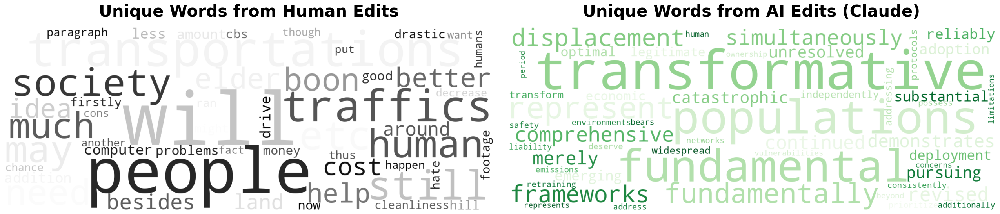

Successfully generated visuals for Claude


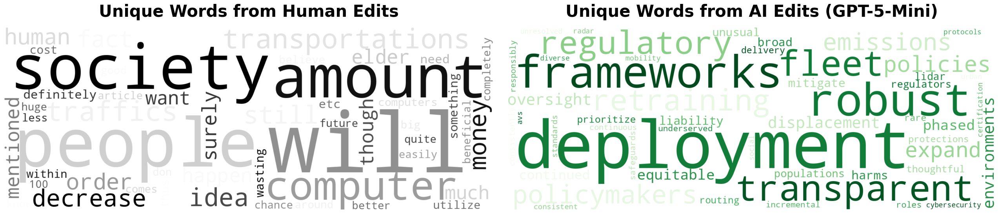

Successfully generated visuals for GPT-5-Mini


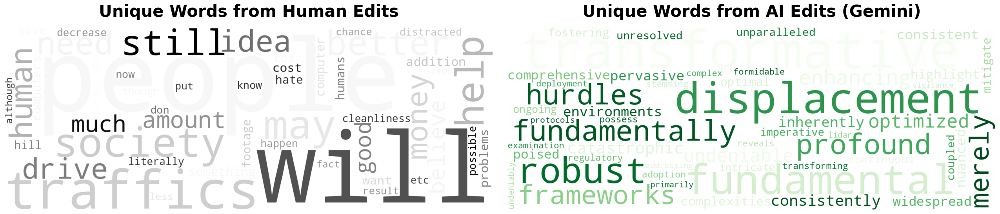

Successfully generated visuals for Gemini


In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
import re

# --------------------------------------------------
# 1. Load data
# --------------------------------------------------
df = pd.read_csv('dataframe_essays_llm_model.csv')

# --------------------------------------------------
# 2. Stopwords
# --------------------------------------------------
topic_stops = {
    'car', 'cars', 'driving', 'vehicle', 'vehicles', 'driver', 'drivers', 
    'road', 'roads', 'traffic', 'technology', 'system', 'systems',
    'autonomous', 'self', 'error', 'accidents', 'accident',
    'safety' 'will', 'would', 'could', 'can', 'one', 'also', 'many',
    'even', 'think', 'make', 'way', 'new', 'well', 'time', 'take', 'able',
    'probably', 'likely', 'potential', 'significant', 'using', 'used', 'use',
    'thing', 'things', 'getting', 'done', 'back', 'lot', 'due', 'towards'
}
all_stops = STOPWORDS.union(topic_stops)

# --------------------------------------------------
# 3. Distinctive frequency calculation
# --------------------------------------------------
def get_distinctive_frequencies(text_target, text_reference):
    def tokenize(text):
        words = re.findall(r'\b\w{3,}\b', text.lower())
        return [w for w in words if w not in all_stops]
    
    counts_target = Counter(tokenize(text_target))
    counts_ref = Counter(tokenize(text_reference))
    
    weighted_freqs = {}
    for word, count in counts_target.items():
        uniqueness_ratio = count / (counts_ref[word] + 1)
        weighted_freqs[word] = count * uniqueness_ratio
    return weighted_freqs

# --------------------------------------------------
# 4. Color functions
# --------------------------------------------------
def black_color_func(*args, **kwargs):
    return "black"

# --------------------------------------------------
# 5. Image generation
# --------------------------------------------------
def save_images(subset, model_name):
    human_text = " ".join(subset['draft2'].dropna().astype(str))
    ai_text = " ".join(subset['ai_text'].dropna().astype(str))
    
    dist_human = get_distinctive_frequencies(human_text, ai_text)
    dist_ai = get_distinctive_frequencies(ai_text, human_text)
    
    # Wide, short word cloud canvas
    wc_params = {
        'width': 1600,
        'height': 600,
        'background_color': 'white',
        'max_words': 50,
        'collocations': False
    }

    title_human = "Unique Words from Human Edits"
    title_ai = f"Unique Words from AI Edits ({model_name})"

    # --------------------------------------------------
    # A. Separate images
    # --------------------------------------------------
    # Human (Black)
    plt.figure(figsize=(14, 6))
    wc_h = WordCloud(
        **wc_params,
        colormap='Greys'
    ).generate_from_frequencies(dist_human)
    plt.imshow(wc_h, interpolation='bilinear')
    plt.title(title_human, fontsize=40, fontweight='bold', pad=20)
    plt.axis("off")
    plt.savefig(f"{model_name.lower()}_separate_human.png", bbox_inches='tight', dpi=300)
    plt.close()

    # AI (Green)
    plt.figure(figsize=(14, 6))
    wc_a = WordCloud(
        **wc_params,
        colormap='Greens'
    ).generate_from_frequencies(dist_ai)
    plt.imshow(wc_a, interpolation='bilinear')
    plt.title(title_ai, fontsize=40, fontweight='bold', pad=20)
    plt.axis("off")
    plt.savefig(f"{model_name.lower()}_separate_ai.png", bbox_inches='tight', dpi=300)
    plt.close()

    # --------------------------------------------------
    # B. Side-by-side horizontal figure
    # --------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(26, 7))

    axes[0].imshow(wc_h, interpolation='bilinear')
    axes[0].set_title(title_human, fontsize=30, fontweight='bold', pad=20)
    axes[0].axis("off")

    axes[1].imshow(wc_a, interpolation='bilinear')
    axes[1].set_title(title_ai, fontsize=30, fontweight='bold', pad=20)
    axes[1].axis("off")

    plt.tight_layout(pad=2.5)
    plt.savefig(f"combined_horizontal_{model_name.lower()}.png", dpi=300)
    plt.show()
    plt.close()

    print(f"Successfully generated visuals for {model_name}")

# --------------------------------------------------
# 6. Run for each model
# --------------------------------------------------
model_mapping = {
    'CLAUDE-HAIKU-4-5-20251001': 'Claude',
    'GPT-5-MINI': 'GPT-5-Mini',
    'GEMINI-2.5-FLASH': 'Gemini'
}

for internal_id, display_name in model_mapping.items():
    model_subset = df[df['llm_model'] == internal_id]
    if not model_subset.empty:
        save_images(model_subset, display_name)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
import re

# 1. Load your three specific dataframes
ai_df = pd.read_csv('ai_df.csv')
human_df = pd.read_csv('human_df.csv')
influenced_df = pd.read_csv('ai_influenced_df.csv')

# 2. Refined Stopwords
topic_stops = {
    'car', 'cars', 'driving', 'vehicle', 'vehicles', 'driver', 'drivers', 
    'road', 'roads', 'traffic', 'technology', 'system', 'systems',
    'autonomous', 'self', 'error', 'accidents', 'accident', 'safety',
    'will', 'would', 'could', 'can', 'one', 'also', 'many', 'even', 
    'think', 'make', 'way', 'new', 'well', 'time', 'take', 'able',
    'probably', 'likely', 'potential', 'significant', 'using', 'used', 'use',
    'thing', 'things', 'getting', 'done', 'back', 'lot', 'due', 'towards'
}
all_stops = STOPWORDS.union(topic_stops)

# 3. Frequency Logic
def get_text_from_df(df):
    # Joining the 'essay_text' column into one giant string
    return " ".join(df['essay_text'].dropna().astype(str))

def get_distinctive_frequencies(target_text, reference_text):
    def tokenize(text):
        words = re.findall(r'\b\w{3,}\b', text.lower())
        return [w for w in words if w not in all_stops]
    
    target_counts = Counter(tokenize(target_text))
    ref_counts = Counter(tokenize(reference_text))
    
    weighted_freqs = {}
    for word, count in target_counts.items():
        # The uniqueness ratio highlights words common in target but rare in reference
        uniqueness_ratio = count / (ref_counts[word] + 1)
        weighted_freqs[word] = count * uniqueness_ratio
    return weighted_freqs

# 4. Prepare Corpus
human_text = get_text_from_df(human_df)
ai_text = get_text_from_df(ai_df)
inf_text = get_text_from_df(influenced_df)

# We compare each group against the combined "rest" to find what's unique to that group
dist_human = get_distinctive_frequencies(human_text, ai_text + " " + inf_text)
dist_ai = get_distinctive_frequencies(ai_text, human_text + " " + inf_text)
dist_inf = get_distinctive_frequencies(inf_text, human_text + " " + ai_text)

# 5. Visualization
def plot_cloud(freqs, title, colormap, filename):
    wc = WordCloud(
        width=1600, height=800,
        background_color='white',
        max_words=50,
        colormap=colormap,
        collocations=False
    ).generate_from_frequencies(freqs)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=20, fontweight='bold')
    plt.axis("off")
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()

# Generate the three clouds
plot_cloud(dist_human, "Unique Human Vocabulary", "Greys", "human_cloud.png")
plot_cloud(dist_ai, "Unique AI Vocabulary", "Greens", "ai_cloud.png")
plot_cloud(dist_inf, "Unique Influenced Vocabulary", "Purples", "influenced_cloud.png")